In [1]:
library(data.table)
library(glue)
library(Matrix)
library(stringr)

In [2]:
devtools::load_all('~/numbat')

ℹ Loading numbat

Registered S3 method overwritten by 'vegan':
  method     from      
  rev.hclust dendextend



In [7]:
out_dir = glue('/home/tenggao/external/multiome/filtered_feature_bc_matrix')
count_mat = readMM(glue('{out_dir}/matrix.mtx.gz')) %>% as.matrix
cells = fread(glue('{out_dir}/barcodes.tsv.gz'), header = FALSE)$V1
genes = fread(glue('{out_dir}/features.tsv.gz'), header = FALSE)$V2
rownames(count_mat) = genes
colnames(count_mat) = cells

In [144]:
atac_peaks = count_mat %>% rownames %>% str_subset('-') %>% str_subset(':') 
genes = rownames(count_mat)[!rownames(count_mat) %in% atac_peaks]

In [145]:
p2 = pagoda2::basicP2proc(count_mat[genes,], n.cores = 20, min.transcripts.per.cell = 0)

14645 cells, 36601 genes; normalizing ... 

Using plain model 

Winsorizing ... 

log scale ... 

done.


calculating variance fit ...

 using gam 

953 overdispersed genes ... 953

persisting ... 

done.

running PCA using 3000 OD genes .

.

.

.

 done




creating space of type angular done
adding data ... done
building index ... done
querying ... done


Estimating embeddings.


running tSNE using 20 cores:




creating space of type angular done
adding data ... done
building index ... done
querying ... done


In [147]:
p2 %>% saveRDS('~/external/multiome/p2.rds')

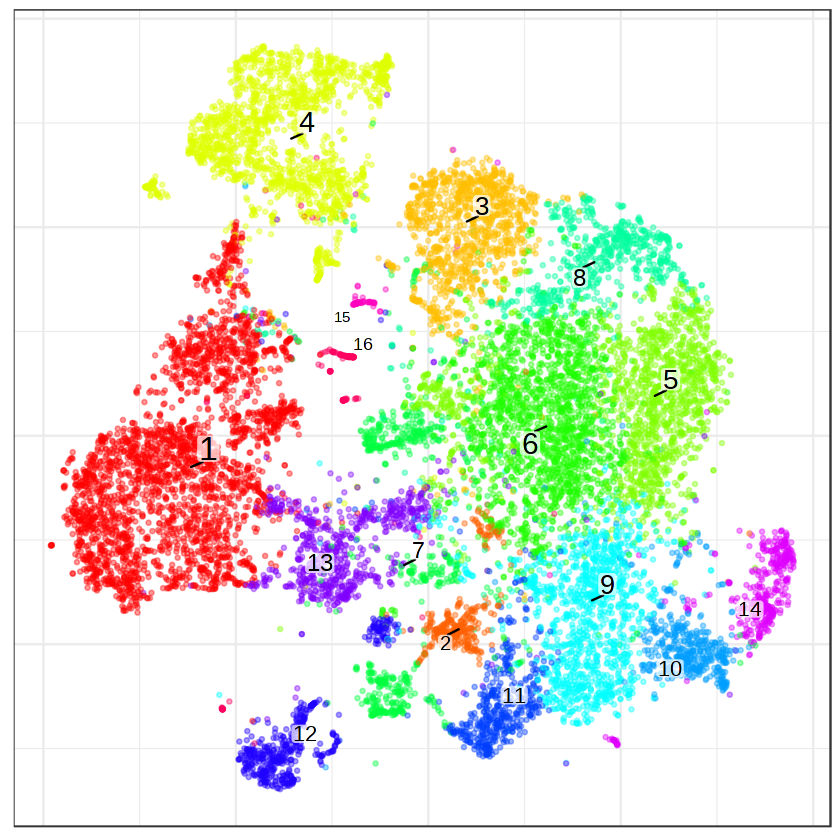

In [164]:
p2$plotEmbedding()

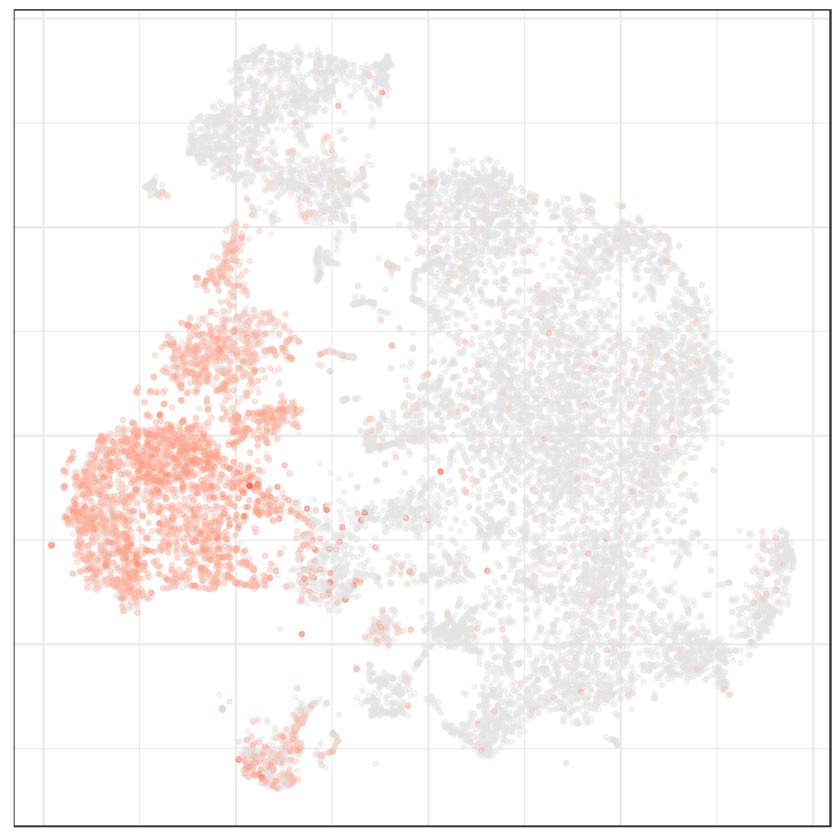

In [165]:
p2$plotEmbedding(gene = 'PAX5')

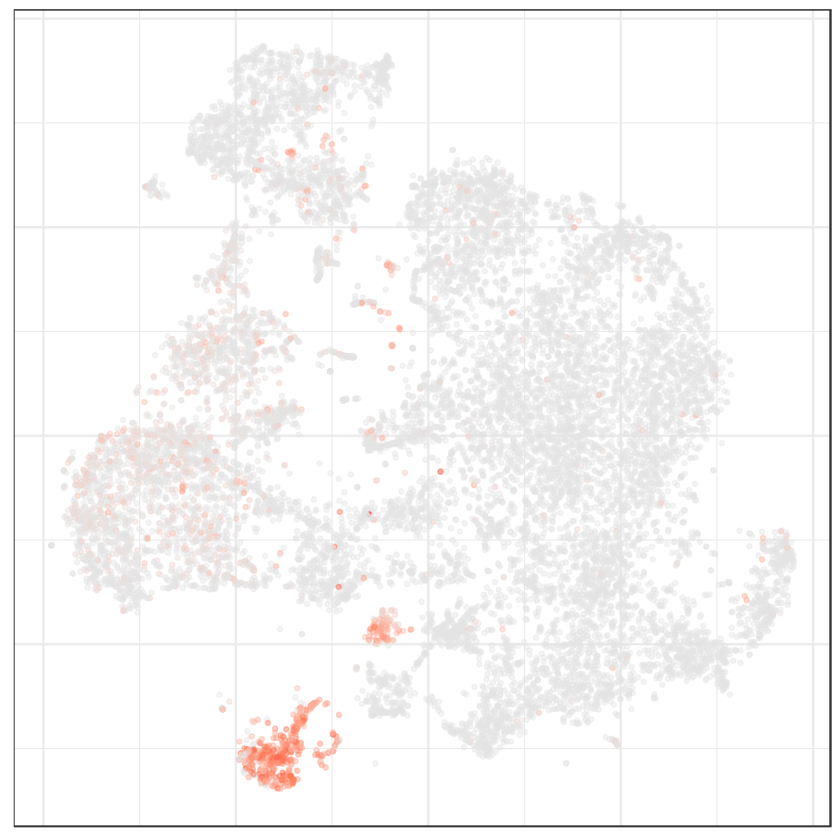

In [168]:
p2$plotEmbedding(gene = 'BANK1')

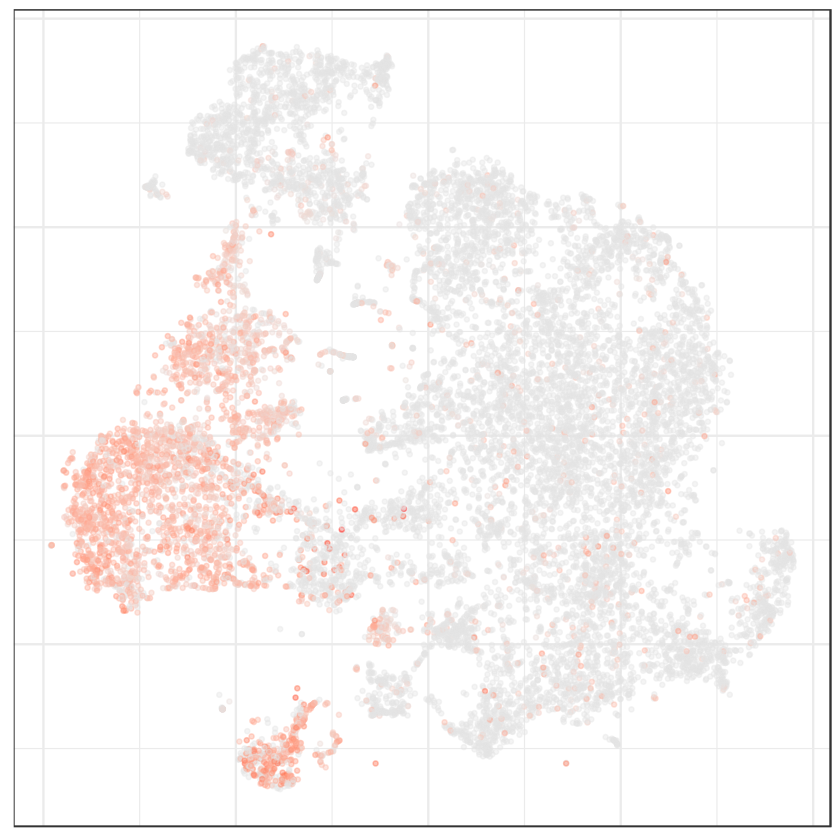

In [166]:
p2$plotEmbedding(gene = 'MS4A1')

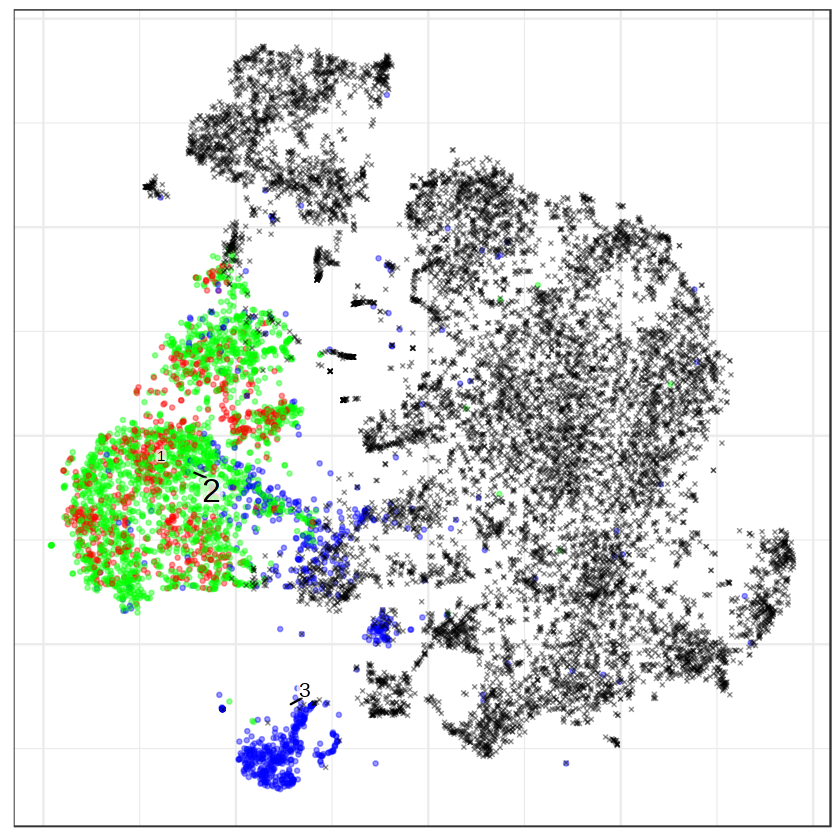

In [167]:
p2$plotEmbedding(
    groups = cutree(clust$hc, k = 3)
)

In [ ]:
clusters = p2$clusters$PCA$multilevel
bcells = clusters[clusters %in% c(1,13,14)] %>% names

In [162]:
sc_refs = choose_ref_cor(count_mat[,bcells], lambdas_ref[,'B',drop=F], gtf_transcript)

In [110]:
library(copykat)
setwd('~/external/multiome')
genes = unique(rownames(count_mat)[rownames(count_mat) %in% gtf_transcript$gene])
res = copykat(
    rawmat=count_mat[genes, bcells], 
    id.type="S",
    ngene.chr=0, 
    win.size=25,
    KS.cut=0.1, 
    sam.name="test", 
    distance="euclidean", 
    norm.cell.names="", 
    output.seg="FLASE", 
    n.cores=30,
    genome = 'hg20'
)

[1] "running copykat v1.0.8 updated 02/25/2022 introduced mm10 module, fixed typos"
[1] "step1: read and filter data ..."
[1] "21381 genes, 3665 cells in raw data"
[1] "filtered out 134 cells with less than 200 genes; remaining 3533 cells"
[1] "8980 genes past LOW.DR filtering"
[1] "step 2: annotations gene coordinates ..."
[1] "start annotation ..."
[1] "step 3: smoothing data with dlm ..."
[1] "step 4: measuring baselines ..."
number of iterations= 111 
number of iterations= 587 
number of iterations= 239 
number of iterations= 265 
number of iterations= 175 
number of iterations= 66 
[1] "low confidence in classification"
[1] "cell: 1"
number of iterations= 285 
[1] "cell: 2"
WARNING! NOT CONVERGENT! 
number of iterations= 500 
[1] "cell: 3"
number of iterations= 101 
[1] "cell: 4"
number of iterations= 289 
[1] "cell: 5"
WARNING! NOT CONVERGENT! 
number of iterations= 500 
[1] "cell: 6"
number of iterations= 163 
[1] "cell: 7"
number of iterations= 187 
[1] "cell: 8"
number of iter

In [57]:
count_mat_all = count_mat

In [61]:
hc = hclust(dist_mat, method = "ward.D2")

In [89]:
clust = exp_hclust(
    count_mat[,bcells],
    ref_hca[,c('B', 'Plasma'),drop=F],
    gtf_hg38,
    ncores = 30
)

Fitted reference proportions:

B:1,Plasma:0.0038

number of genes left: 7911

running hclust...



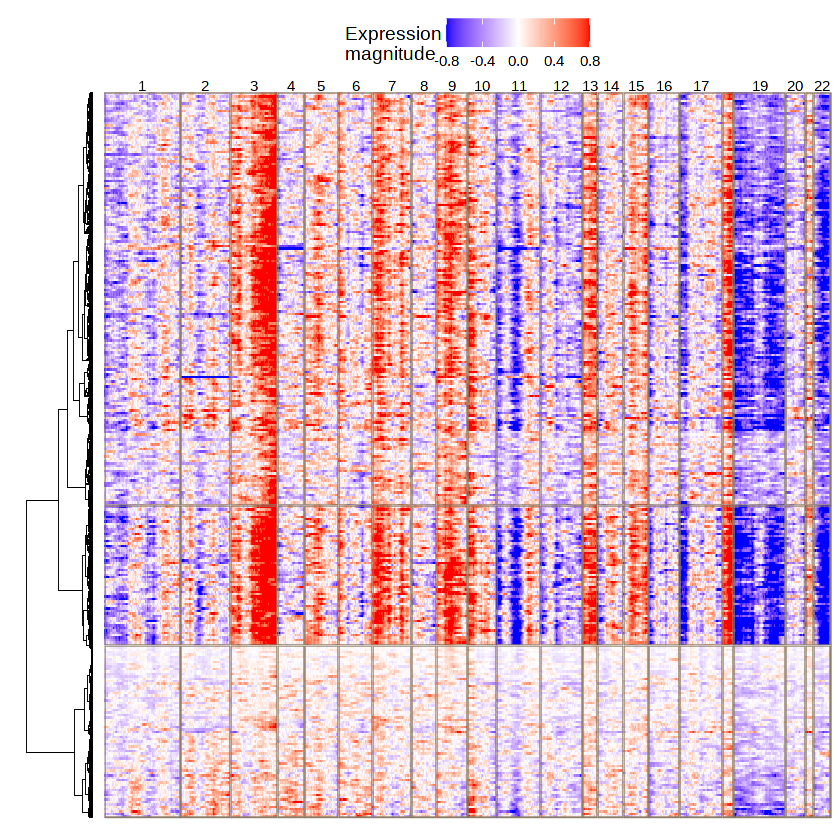

In [90]:
options(repr.plot.width = 6.5, repr.plot.height = 3, repr.plot.res = 200)

plot_sc_roll(
    clust$gexp_roll_wide %>% as.data.frame() %>% tibble::rownames_to_column('cell'),
    clust$hc,
    k = 3,
    gtf_transcript,
    n_sample = 300
)

In [ ]:
res

In [8]:
count_mat %>% head

,AAACAGCCAGAACCGA-1,AAACAGCCAGCCTAAC-1,AAACAGCCATATTGAC-1,AAACATGCAAATTCGT-1,AAACATGCAACCTAAT-1,AAACATGCAACTAGGG-1,AAACATGCACGAATTT-1,AAACATGCACTAGCGT-1,AAACATGCAGAAATTG-1,AAACATGCAGGAACAT-1,⋯,TTTGTGTTCCTGTTCA-1,TTTGTGTTCCTTCAAT-1,TTTGTGTTCTAACCTT-1,TTTGTGTTCTAAGGAG-1,TTTGTGTTCTTACTCG-1,TTTGTTGGTATGGTGC-1,TTTGTTGGTCAATACG-1,TTTGTTGGTCAGGAAG-1,TTTGTTGGTTCAAGAT-1,TTTGTTGGTTTACTTG-1
MIR1302-2HG,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
FAM138A,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
OR4F5,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.3,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [33]:
nb = Numbat$new('~/paper_data/numbat_out/ATC1_demo')

In [346]:
remove.packages('numbat')

Removing package from ‘/home/tenggao/R/x86_64-pc-linux-gnu-library/4.1’
(as ‘lib’ is unspecified)



In [12]:
library(igraph)


Attaching package: ‘igraph’


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




In [56]:
library(logger)
library()

Warning message:
“Using alpha for a discrete variable is not advised.”


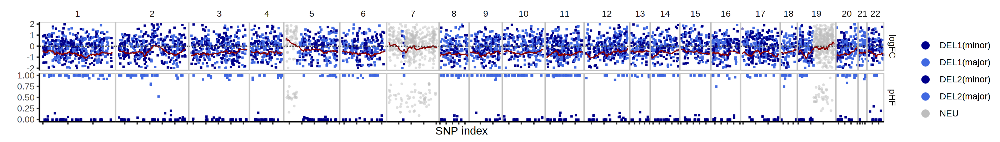

In [22]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)

plot_psbulk(bulk)

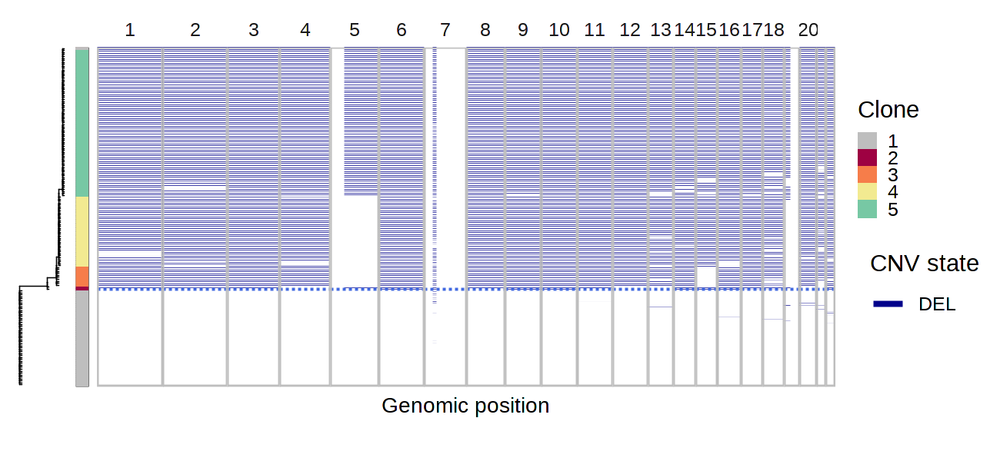

In [6]:
options(repr.plot.width = 6.5, repr.plot.height = 3, repr.plot.res = 200)

plot_psbulkplot_heatmap(
    clone_bar = TRUE
) 

In [2]:
library(ggplot2)
library(dplyr)
library(Matrix)
library(data.table)
library(stringr)
library(patchwork)
library(glue)
library(ggforce)
library(vcfR)
library(purrr)
library(phangorn)
library(magrittr)
library(parallel)
library(ggpubr)
library(tidygraph)
library(extraDistr)
library(IRdisplay)
library(igraph)
library(ggridges)
library(multidplyr)
library(ggtree)
library(ggraph)
library(phangorn)
options(repr.matrix.max.cols=30, repr.matrix.max.rows=20)
options(repr.vector.max.items = 50)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last



   *****       ***   vcfR   ***       *****
   This is vcfR 1.12.0 
     browseVignettes('vcfR') # Documentation
     citation('vcfR') # Citation
   *****       *****      *****       *****



Attaching package: ‘purrr’


The following object is masked from ‘package:data.table’:

    transpose


Loading required package: ape


Attaching package: ‘magrittr’


The following object is masked from ‘package:purrr’:

    set_names



Attaching package: ‘ggpubr’


The following object is masked from ‘package:ape’:

    rotate



Attaching package: ‘tidygraph’


The following object is masked from ‘package:stats’:

    filter



Attaching package: ‘extraDistr’


The following obj

In [ ]:
cell_annot = fread('~/paper_data/cell_annotations/cell_annot_MDA.tsv') %>%
    split(.$sample)

con_TNBC = readRDS('~/external/MDA/conos_TNBC.rds')
con_ATC = readRDS('~/external/MDA/conos_ATC.rds')

In [240]:
R.utils::sourceDirectory('~/Numbat/R')

sample = 'TNBC1'
out_dir = glue('~/paper_data/numbat_out/{sample}')

numbat <- Numbat$new(out_dir = out_dir)

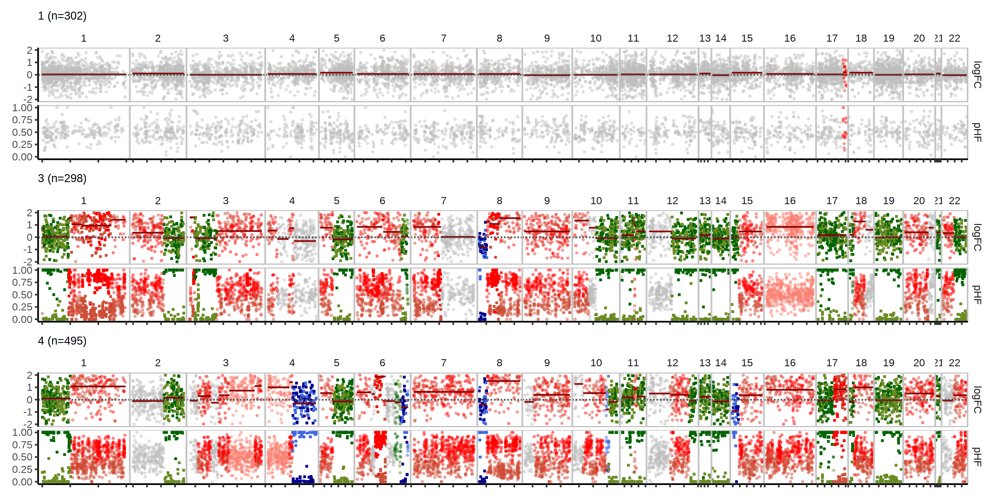

In [241]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 200)

numbat$plot_bulks(min_depth = 10, phi_mle = TRUE)

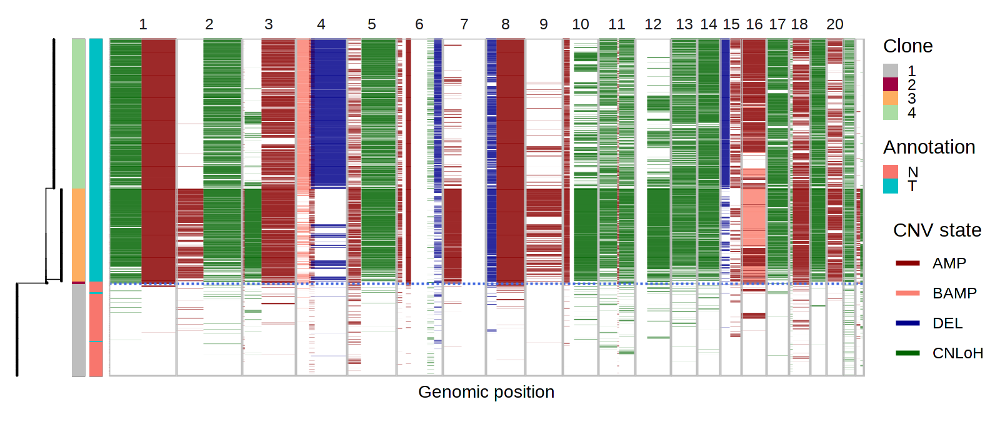

In [191]:
options(repr.plot.width = 8, repr.plot.height = 3.5, repr.plot.res = 200)

numbat$plot_heatmap(
    multi_allelic = T,
    clone_bar = T,
    annot = cell_annot[[sample]] %>% {setNames(.$cluster.pred, .$cell)}
)

# DCIS1

In [155]:
R.utils::sourceDirectory('~/Numbat/R')

sample = 'DCIS1'
out_dir = glue('~/paper_data/numbat_out/{sample}')

In [156]:
res[[sample]] = fetch_results(out_dir, i = 2)

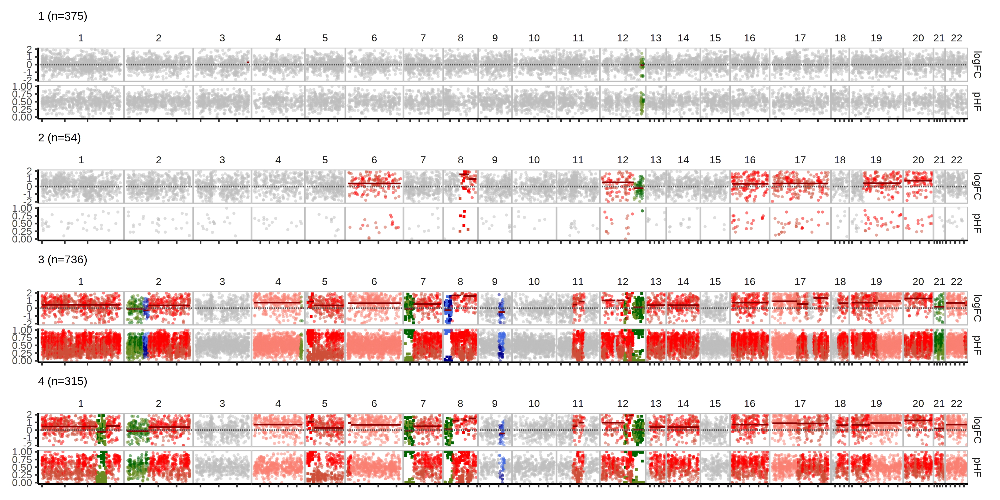

In [160]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 300)

res[[sample]]$bulk_clones %>% plot_bulks()

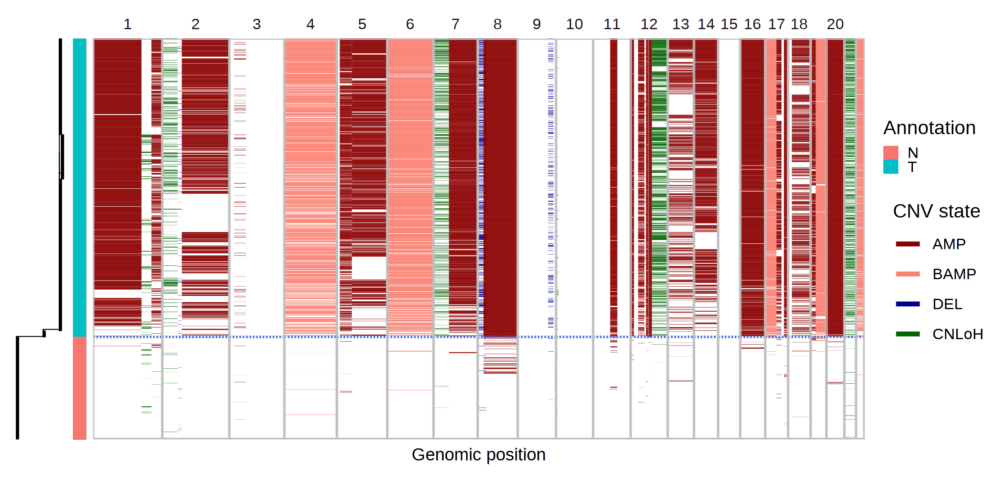

In [650]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)
R.utils::sourceDirectory('~/Numbat/R')

sample = 'DCIS1'
plot_sc_joint(
    res[[sample]]$gtree,
    res[[sample]]$joint_post,
    res[[sample]]$segs_consensus,
    tip_length = 1,
    branch_width = 0.2,
    size = 0.075,
    p_min = 0.9,
    cell_dict = cell_annot[[sample]] %>% {setNames(.$cluster.pred, .$cell)}
)

In [591]:
copykat.cna = fread('~/paper_data/copykat_out/DCIS1/DCIS1_copykat_CNA_results.txt') %>%
    rename(CHROM = chrom, POS = chrompos)

In [621]:
sample = 'DCIS1'

copykat.pred = fread('~/paper_data/copykat_out/DCIS1/DCIS1_copykat_prediction.txt') %>% 
    rename(cell = cell.names, pred = copykat.pred)

copykat.cna.long = copykat.cna %>% 
    filter(CHROM != 23) %>%
    reshape2::melt(id.var = c('CHROM', 'POS'), variable.name = 'cell', value.name = 'score') %>%
    mutate(cell = str_replace(cell, '\\.', '-')) %>%
    left_join(copykat.pred, by = 'cell')

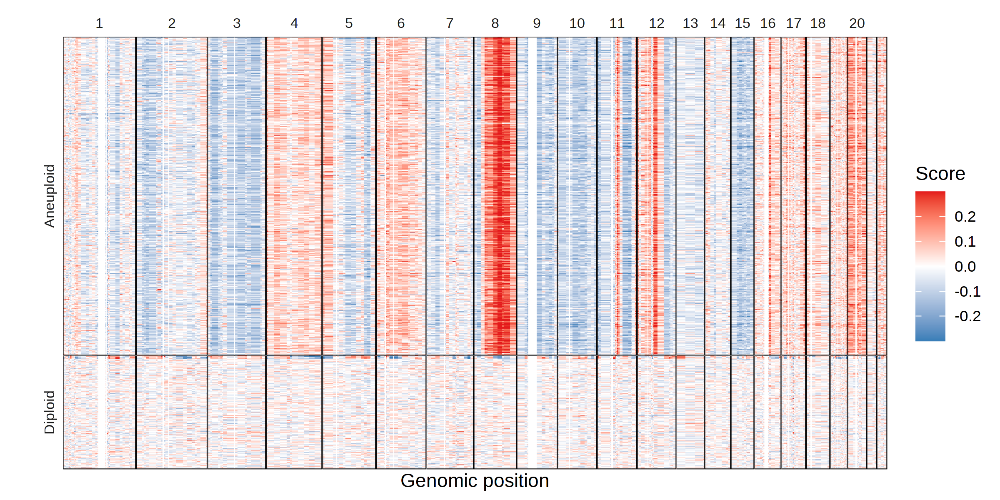

In [638]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)

chrom_labeller <- function(chr){
        # chr[as.integer(chr) %% 2 == 0] = ''
        chr[chr %in% c(19, 21, 22)] = ''
        return(chr)
    }

copykat.cna.long %>%
filter(!is.na(pred)) %>%
# filter(cell %in% sample(unique(cell), 50)) %>%
mutate(pred = str_to_title(pred)) %>%
ggplot(
    aes(x = POS, y = cell, fill = score)
) +
xlab('Genomic position') +
ylab('') +
geom_tile() +
theme_classic() +
scale_y_discrete(expand = expansion(0)) +
scale_x_discrete(expand = expansion(add = 0.5)) +
theme(
    panel.spacing = unit(0.1, 'mm'),
    axis.line.x = element_blank(),
    axis.line.y = element_blank(),
    axis.ticks = element_blank(),
    panel.border = element_rect(color = 'black', size = 0.2, fill = NA),
    panel.background = element_rect(fill = 'white'),
    strip.background = element_blank(),
    axis.text = element_blank(),
    strip.text = element_text(angle = 0, size = 8)
) +
scale_fill_gradient2(low = pal[2], high = pal[1], midpoint = 0, limits = c(-0.3, 0.3), oob = scales::oob_squish, name = 'Score') +
facet_grid(pred~CHROM, scale = 'free', space = 'free', labeller = labeller(CHROM = chrom_labeller), switch = 'y')

### CNV Color legend

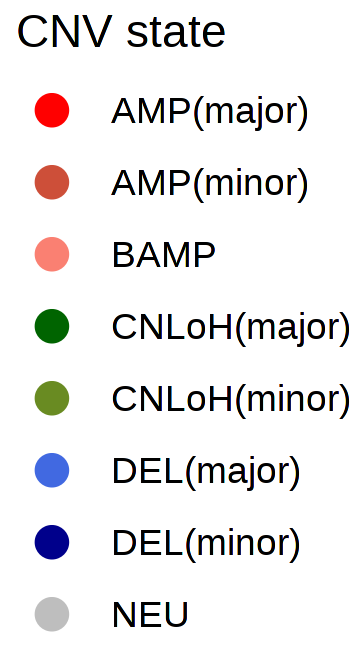

In [636]:
options(repr.plot.width = 1.2, repr.plot.height = 2.2, repr.plot.res = 300)

p = data.frame(
    state = c('AMP_up', 'AMP_down', 'DEL_up', 'DEL_down', 'CNLoH_up', 'CNLoH_down', 'NEU', 'BAMP')
) %>%
mutate(
    state = state %>% str_replace('_up', '(major)') %>% 
        str_replace('_down', '(minor)')
) %>%
ggplot(
    aes(x = state, y = state, color = state)
) +
geom_point() +
scale_color_manual(values = setNames(cnv_colors, names(cnv_colors) %>% 
    str_replace('_up', '(major)') %>% 
    str_replace('_down', '(minor)') %>%
    str_replace('loh', 'CNLoH') %>%
    str_replace('bamp', 'BAMP') %>%
    str_replace('amp', 'AMP') %>%
    str_replace('del', 'DEL') %>%
    str_replace('neu', 'NEU')
)) +
theme_classic() +
guides(color = guide_legend(override.aes = aes(size = 3), title = 'CNV state'))

get_legend(p) %>% as_ggplot

Warning message:
“Using alpha for a discrete variable is not advised.”


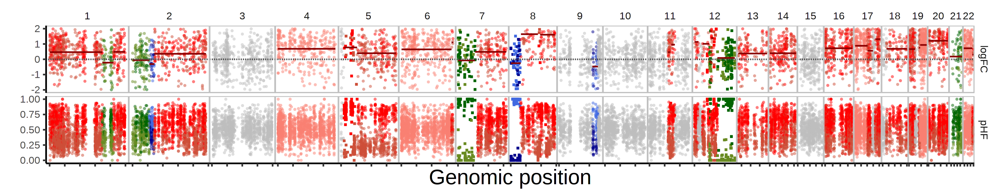

In [658]:
options(repr.plot.width = 12, repr.plot.height = 2.35, repr.plot.res = 300)
R.utils::sourceDirectory('~/Numbat/R')
sample = 'DCIS1'
res[[sample]]$bulk_subtrees %>% 
filter(sample %in% c(4)) %>% 
plot_psbulk(phi_mle = T, legend = F, use_pos = TRUE) +
theme(axis.title.x = element_text(size = 18))

# TNBC2

In [1138]:
res = c()

In [432]:
R.utils::sourceDirectory('~/Numbat/R')

sample = 'TNBC2'
out_dir = glue('~/paper_data/numbat_out/{sample}')
res[[sample]] = fetch_results(out_dir, i = 2)

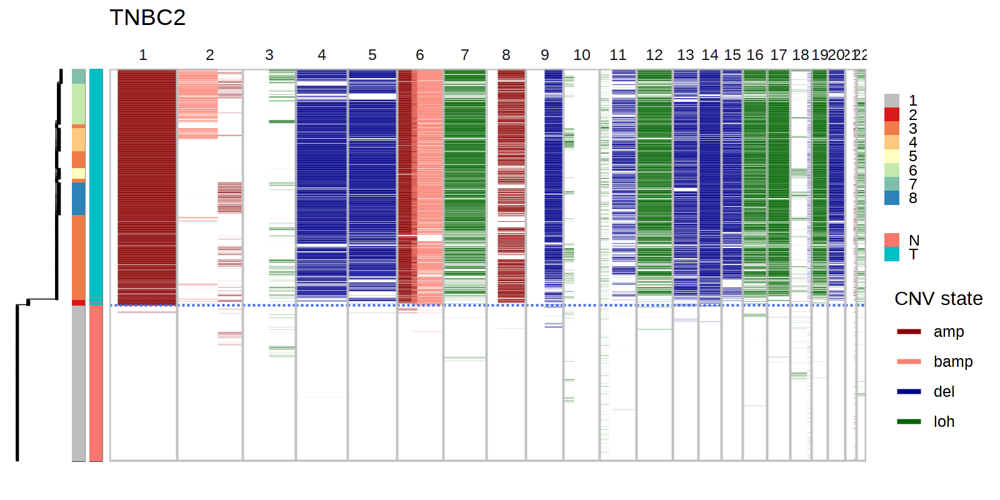

In [436]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

plot_sc_joint(
    res[[sample]]$gtree,
    res[[sample]]$joint_post,
    res[[sample]]$segs_consensus,
    tip_length = 1,
    branch_width = 0.2,
    size = 0.1,
    cell_dict = cell_annot[[sample]] %>% {setNames(.$cluster.pred, .$cell)},
    logBF_min = 0,
    logBF_max = 10,
    clone_bar = T
) +
ggtitle(sample)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



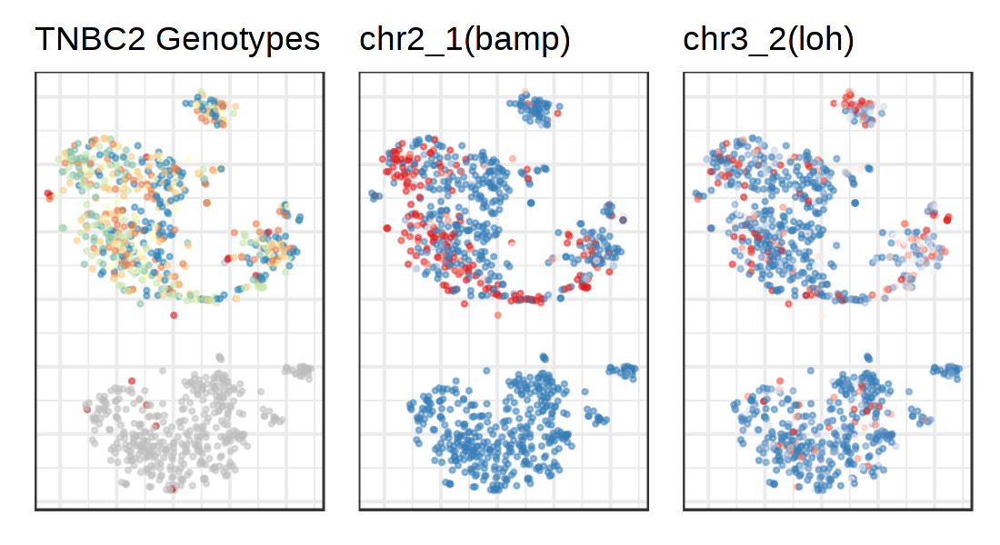

In [443]:
options(repr.plot.width = 5.5, repr.plot.height = 3, repr.plot.res = 200)
sample = 'TNBC2'
muts = c('2_1', '3_2')
cnv_states = res[[sample]]$joint_post %>% distinct(seg, cnv_state) %>% {setNames(.$cnv_state, .$seg)}
getPalette = colorRampPalette(RColorBrewer::brewer.pal(n = 5, 'Spectral'))

p_clones = con_TNBC$samples[[sample]]$plotEmbedding(
    alpha=0.5,
    size=0.5, 
    groups = res[[sample]]$clone_post %>%
        {setNames(.$clone_opt, .$cell)},
    show.legend = F,
    mark.groups = F,
    plot.na = F,
    plot.theme = theme_bw(),
    title = paste0(sample, ' Genotypes'),
    pal = c('gray', getPalette(length(unique(res[[sample]]$clone_post$clone_opt))-1))
)
# scale_color_manual(values = c('Normal' = 'gray', 'A' = pal[3], 'B' = pal[4]))

plist = list()
plist[[1]] = p_clones

for (mut in muts) {
    
    plist[[mut]] = con_TNBC$samples[[sample]]$plotEmbedding(
        alpha=0.5,
        size=0.5, 
        plot.na = F, 
        colors = res[[sample]]$joint_post %>%
            left_join(
                res[[sample]]$clone_post %>% select(clone_opt, cell), by = 'cell'
            ) %>%
            filter(seg == mut) %>%
            {setNames(.$p_cnv, .$cell)},
        show.legend = F,
        mark.groups = F,
        plot.theme = theme_bw(),
        title = paste0('chr', mut, '(', cnv_states[mut], ')')
#         title = mut
    ) +
    scale_color_gradient2(
        low = pal[2], mid = 'white', high = pal[1],
        midpoint = 0.5, guide = guide_colorbar(title = 'Posterior\nprobability'), limits = c(0,1)
    )
}

wrap_plots(plist, nrow = 1, legend = 'top')

# TNBC1

In [6]:
R.utils::sourceDirectory('~/Numbat/R')

sample = 'TNBC1'
out_dir = glue('~/paper_data/numbat_out/{sample}')
res[[sample]] = fetch_results(out_dir, i = 2)

In [545]:
tree_post = res[[sample]]$tree_post
max_cost = 400

G_m = get_mut_tree(tree_post$gtree, tree_post$mut_nodes)  %>% 
            simplify_history(tree_post$l_matrix, max_cost = max_cost) %>% 
            label_genotype()

mut_nodes = G_m %>% igraph::as_data_frame('vertices') %>% 
    select(name = node, site = label, clone = clone, GT = GT)

# update tree
gtree = mut_to_tree(tree_post$gtree, mut_nodes)
res[[sample]]$gtree = mark_tumor_lineage(gtree)

In [143]:
chrs = c(1,2,3)

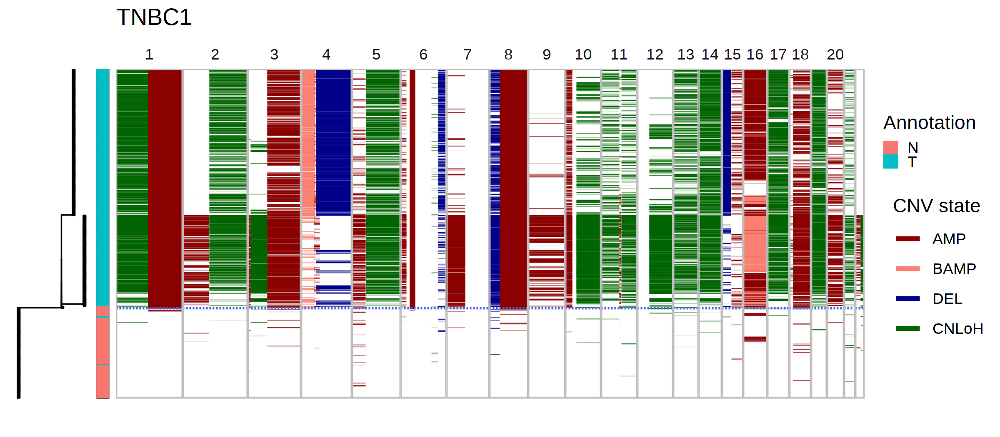

In [726]:
options(repr.plot.width = 8, repr.plot.height = 3.5, repr.plot.res = 300)
R.utils::sourceDirectory('~/Numbat/R')

sample = 'TNBC1'

getPalette = colorRampPalette(pal)

p = plot_sc_joint(
        res[[sample]]$gtree,
        res[[sample]]$joint_post,
        res[[sample]]$segs_consensus,
        tip_length = 1,
        branch_width = 0.3,
        size = 0.15,
        logBF_min = 2,
        logBF_max = 5,
        cell_dict = cell_annot[[sample]] %>% {setNames(.$cluster.pred, .$cell)},
        pal_clone = c('gray', 'red3', pal[3], pal[4]),
        clone_bar = F,
        p_min = 0.9,
        tree_height = 1.5,
        multi_allelic = TRUE
    ) +
    theme(axis.title.x = element_blank()) +
    ggtitle(sample) & 
    theme(plot.background = element_rect(fill = "transparent", color = NA)) 

ggsave("~/figures/TNBC1_phylogeny.png", p, bg = "transparent", width = 8, height = 3.5, dpi = 300)

p

In [ ]:
R.utils::sourceDirectory('~/Numbat/R')

bulk = res[[sample]]$bulk_clones %>% filter(sample == 4) %>% analyze_bulk(t = 1e-1, diploid_chroms = c(13,14,19))

Retesting CNVs..



In [ ]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')
sample = 'TNBC1'

bulk %>% plot_bulks(phi_mle = TRUE, legend = F)

In [261]:
R.utils::sourceDirectory('~/Numbat/R')

bulks = res[[sample]]$bulk_subtree %>% run_group_hmms(t = 1e-5, diploid_chroms = c(13,14,19))

Warning message:
“Removed 80362 rows containing missing values (geom_point).”
Warning message:
“Removed 82572 rows containing missing values (geom_point).”


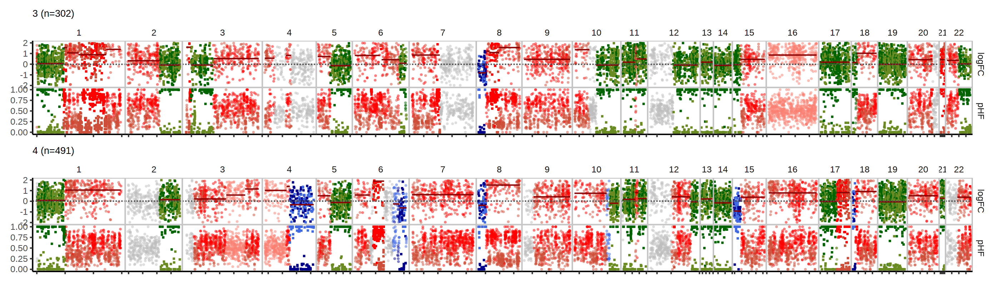

In [280]:
options(repr.plot.width = 14, repr.plot.height = 4, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')
sample = 'TNBC1'

res[[sample]]$bulk_clones %>% 
    filter(sample %in% c(3,4)) %>% 
    plot_bulks(phi_mle = TRUE, legend = F)

In [57]:
clone_post = fread(glue('{out_dir}/clone_post_{i}.tsv'))